# Setup

In [1]:
%%capture
import scanpy as sc
import scvi
import os
import anndata as ad
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import warnings
import scrublet as scr
import shutil

In [2]:
sc.set_figure_params(figsize=(4,4),  dpi=150, dpi_save=300, facecolor="white", frameon=False)
plt.rcParams["axes.grid"] = False
sns.set_context("paper")
warnings.simplefilter(action='ignore', category=FutureWarning)

In [3]:
os.getcwd()

'/home/joe/Repositories/mTEC-eTAC-atlases/mTEC-analysis'

## Set data paths

### demeter

In [4]:
rawDataPath = "/mnt/iacchus/joe/raw_data/"
processedDataPath = "/mnt/iacchus/joe/processed_data/"

### gardner-lab-computer

In [5]:
# rawDataPath = "/mnt/e/Archive/Joe/raw_data/"
# processedDataPath = "/mnt/e/Archive/Joe/processed_data/"

# Import data

## Michelson 2022

In [6]:
adataMichelson = sc.read_10x_mtx(f"{rawDataPath}/Thymus/Michelson_2022/scRNAseq/adult_perinate_gex/", prefix="GSM5831744_adult_perinate_gex_", cache=True)
metadata = pd.read_csv(f"{rawDataPath}/Thymus/Michelson_2022/scRNAseq/GSM5831744_adult_perinate_metadata.txt", index_col=0, sep=" ")
adataMichelson = adataMichelson[adataMichelson.obs.index.isin(metadata.index)]
adataMichelson.layers["counts"] = adataMichelson.X.copy()
adataMichelson.obs["hash"] = metadata.hash_ident
adataMichelson.obs["batch"] = metadata.hash_ident
# adataMichelson = adataMichelson[adataMichelson.obs.hash.str.startswith("adult")]
adataMichelson.obs["cell_type"] = "other_dataset"
adataMichelson.obs["genotype"] = "WT"
adataMichelson.obs["dataset"] = "Mathis"

In [7]:
adata = adataMichelson

# Preprocessing

In [8]:
# Annotate mito genes
adata.var["mt"] = adata.var_names.str.startswith("mt-")
# Get qc metrics for each cell, gene
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True, percent_top=None, log1p=False,)
# Basic prefiltering of empty cells, 0 counts genes
sc.pp.filter_cells(adata, min_genes=1)
sc.pp.filter_genes(adata, min_cells=1)

## QC plotting

### QC filter

In [9]:
# Helper method for plotting QC metrics for scrnaseq package
def qc_plot(adata, counts_thresh=30000, genes_thresh=5000, mt_thresh=10, show_thresh=True, save_path=None):
    sns.set_style("ticks")
    sns.set_context("paper")
    fig=plt.figure(figsize=(9,3))
    plt.subplot(1,3,1)
    sns.histplot(
        x=adata.obs.pct_counts_mt,
        hue=adata.obs.batch,
    )
    if show_thresh:
        plt.axvline(
            x=mt_thresh,
            ymin=0,
            ymax=1,
            color="black",
            linestyle="--",
        )

    plt.subplot(1,3,2)
    sns.scatterplot(
        x=adata.obs.total_counts,
        y=adata.obs.n_genes_by_counts,
        s=2,
        hue=adata.obs.batch,
        linewidth=0,
    )
    if show_thresh:
        plt.axvline(
            x=counts_thresh,
            ymin=0,
            ymax=1,
            color="black",
            linestyle="--",
        )
        plt.axhline(
            y=genes_thresh,
            xmin=0,
            xmax=1,
            color="black",
            linestyle="--",
        )
    plt.subplot(1,3,3)
    cell_data = pd.DataFrame()
    for category in adata.obs.batch.unique():
        category_data = adata[adata.obs.batch == category].obs.copy()
        category_data["rank"] = category_data.total_counts.rank(method="first", ascending=False,)
        cell_data = pd.concat([cell_data, category_data])
    cell_data = cell_data.sort_values(by="rank")
    ax =sns.lineplot(
        x=cell_data["rank"],
        y=cell_data.total_counts,
        hue=cell_data.batch,
        hue_order=adata.obs.batch.unique(),
    )
    ax.set(yscale="log")
    ax.set(xscale="log")
    if show_thresh:
        plt.axhline(
            y=counts_thresh,
            xmin=0,
            xmax=1,
            color="black",
            linestyle="--",
        )
    if save_path is not None:
        plt.savefig(save_path, bbox_inches="tight", dpi=300)
    plt.show()

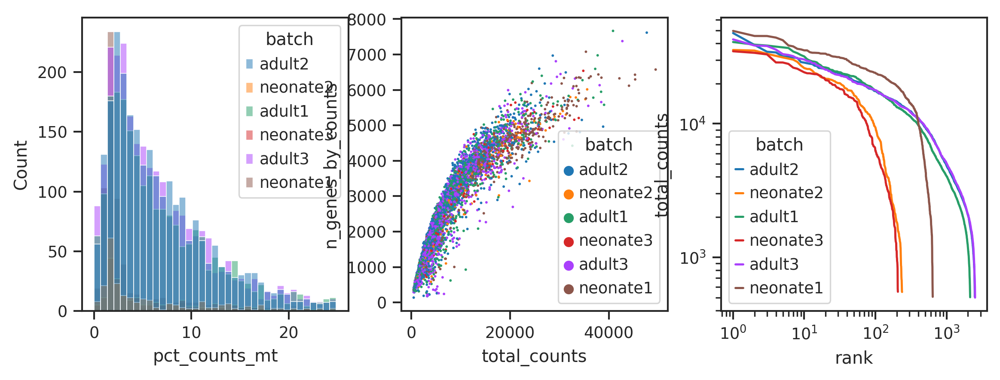

In [10]:
# Check QC thresholds before filtering
qc_plot(adata, show_thresh=False,)

## Normalize data (scanpy)

In [11]:
# Scanpy preprocessing pipeline
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata # Preserve log-transformed counts in the raw attribute

# scVI training

In [12]:
# Setup scVI model using raw counts and batch info
scvi.model.SCVI.setup_anndata(
    adata,
    layer="counts",
    batch_key="batch",
)
model = scvi.model.SCVI(adata)

In [13]:
# Train scVI model
model.train()

Epoch 400/400: 100%|██████████| 400/400 [05:44<00:00,  1.16it/s, loss=6.27e+03, v_num=1]


In [14]:
# get scVI latent space and normalized expression
adata.obsm["X_scVI"] = model.get_latent_representation()
adata.layers["scVI_normalized"] = model.get_normalized_expression(library_size=1e4)

In [15]:
# Checl save paths
if not os.path.isdir(f"{processedDataPath}/mTEC_analysis/scVI_models"):
    os.makedirs(f"{processedDataPath}/mTEC_analysis/scVI_models")
    
if not os.path.isdir(f"{processedDataPath}/mTEC_analysis/h5ad_files"):
    os.makedirs(f"{processedDataPath}/mTEC_analysis/h5ad_files")
    
if os.path.isdir(f"{processedDataPath}/mTEC_analysis/scVI_models/mathis_PA_thymus"):
    shutil.rmtree(f"{processedDataPath}/mTEC_analysis/scVI_models/mathis_PA_thymus")
    
# save the scVI model and adata object before further processing because training is non-deterministic
model.save(f"{processedDataPath}/mTEC_analysis/scVI_models/mathis_PA_thymus")
adata.write(f"{processedDataPath}/mTEC_analysis/h5ad_files/mathis_PA_thymus.h5ad")

# Dimensionality reduction

In [16]:
adata = sc.read(f"{processedDataPath}/mTEC_analysis/h5ad_files/mathis_PA_thymus.h5ad")

In [17]:
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.umap(adata, min_dist=0.25,)

# Clustering

/conda-global-envs/single-cell-analysis/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/conda-global-envs/single-cell-analysis/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


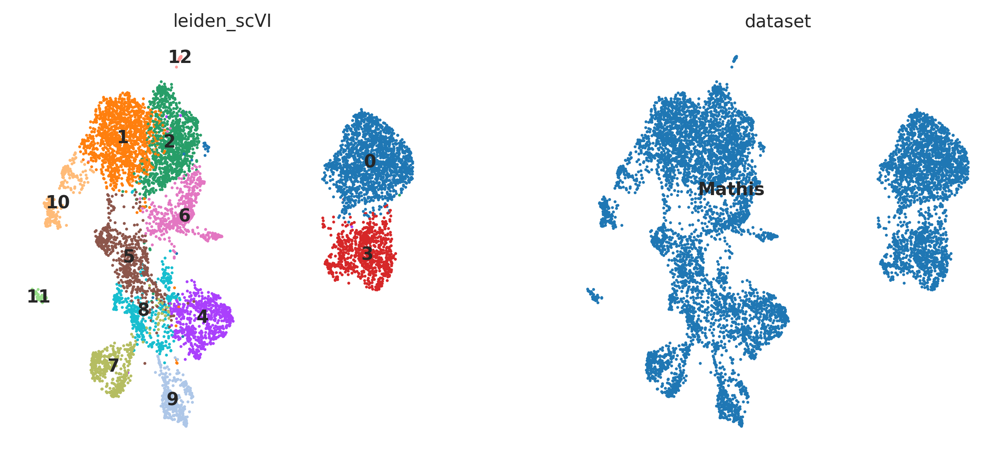

In [18]:
sc.tl.leiden(adata, key_added="leiden_scVI", resolution=0.48)
sc.pl.umap(
    adata,
    color=["leiden_scVI", "dataset"],
    legend_loc="on data",
    s=10,
)

# Cell Type Assignment

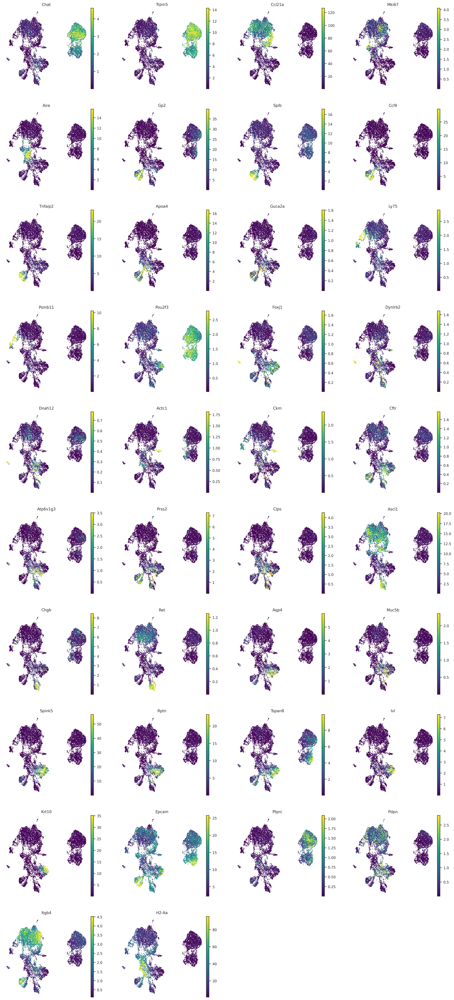

In [19]:
# Rename leiden clusters with corresponding cell types
cellTypes = {

}
adata.obs["cell_type_aggregated"] = adata.obs.leiden_scVI.replace(cellTypes)

# Plot key marker genes
geneList = ["Chat", "Trpm5", # Tuft 1
            "Ccl21a", # Immature mTEC
            "Mki67", # TAC-TECs
            "Aire", # Aire+
            "Gp2", "Spib", "Ccl9", "Tnfaip2", # M cell
            "Apoa4", "Guca2a", # Enterocyte
            "Ly75", "Psmb11", # cTECs
            "Pou2f3", # Tuft 2?
            "Foxj1", "Dynlrb2", "Dnah12", # Ciliated
            "Actc1", "Ckm", # Muscle
            "Cftr", "Atp6v1g3", # Ionocyte
            "Prss2", "Clps", # Pancreatic
            
            "Ascl1", "Chgb", "Ret", # neuroendocrine
            "Aqp4", "Muc5b", # Goblet
            "Spink5", "Rptn", # Basal lung
            "Tspan8", "Ivl", "Krt10", # Basal Skin/ Keratinocyte
            "Epcam", "Ptprc", "Pdpn", "Itgb4", "H2-Aa"]
vmin=[]
vmax=[]
for gene in geneList:
    vmin.append(np.quantile(adata[:, gene].layers["scVI_normalized"], 0.01))
    vmax.append(np.quantile(adata[:, gene].layers["scVI_normalized"], 0.99))
sc.pl.umap(
    adata[(adata.obs.genotype == "WT")],# & (adata.obs.dataset == "Mathis")],
    color=geneList,
    layer="scVI_normalized",
    vmin=vmin,
    vmax=vmax,
    cmap="viridis",
    s=10,
)

In [20]:
adata.write(f"{processedDataPath}/mTEC_analysis/h5ad_files/mathis_PA_thymus.h5ad")